## 1. Data 유형 확인

- 해당 절에선 정형데이터(Structured Data), 반정형데이터(Semi-Structured Data), 비정형데이터(Unstructured Data)의 예시를 불러와서 각각 확인합니다.

-   | 데이터 타입 | 대표 확장자 |
    |------------|------|
    | **Structured** | .csv |
    | **Semi-Structured** | .json |
    | **Unstructured** | .jpg, .txt, .mp3, .mp4 |

### 1.1 Structured Data

In [1]:
from pathlib import Path
import pandas as pd

path_lecture = Path("data")
df = pd.read_csv(path_lecture / "winequality.csv")
display(df.head())
print(f"Data Shape: {df.shape}")

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


Data Shape: (6497, 13)


In [2]:
print(df.columns)

Index(['type', 'fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol',
       'quality'],
      dtype='object')


### 참고: 와인 데이터셋 칼럼 설명

| 칼럼명 | 설명 |
|--------|------|
| **type** | 와인의 종류 (레드/화이트) |
| **fixed acidity** | 와인의 비휘발성 산 (예: 주석산) |
| **volatile acidity** | 와인의 휘발성 산, 향과 맛에 영향 |
| **citric acid** | 구연산 함량, 신선함과 풍미를 추가 |
| **residual sugar** | 발효 후 남은 당분 (g/L) |
| **chlorides** | 와인의 염화물(소금) 함량, 맛에 영향 |
| **free sulfur dioxide** | 미생물 성장 방지를 위한 유리 SO₂ |
| **total sulfur dioxide** | 총 SO₂ (유리 + 결합), 보존성에 영향 |
| **density** | 와인의 밀도, 당도와 알코올 함량과 관련 |
| **pH** | 와인의 산도 수준 |
| **sulphates** | 황산염 함량, 보존성과 향에 기여 |
| **alcohol** | 알코올 함량 (%) |
| **quality** | 와인의 품질 점수 (0~10) |

### 1.2 Semi-Structured Data

- 관계형 DB가 아닌 Mongo DB와 같은 No SQL DB 에 저장

- 데이터 스키마가 주어져 있지 않아 유연하게 사용가능하다는 장점

In [3]:
import json
import pprint

data_str = """{
    "employees": [
        {"name": "Alice", "age": 28, "occupation": "Engineer"},
        {"name": "Bob", "age": 24, "occupation": "Data Scientist"},
        {"name": "Charlie", "age": 22, "occupation": "Designer"}
    ]
}"""

data = json.loads(data_str)
pprint.pprint(data)

{'employees': [{'age': 28, 'name': 'Alice', 'occupation': 'Engineer'},
               {'age': 24, 'name': 'Bob', 'occupation': 'Data Scientist'},
               {'age': 22, 'name': 'Charlie', 'occupation': 'Designer'}]}


### 1.3 비정형 데이터 확인

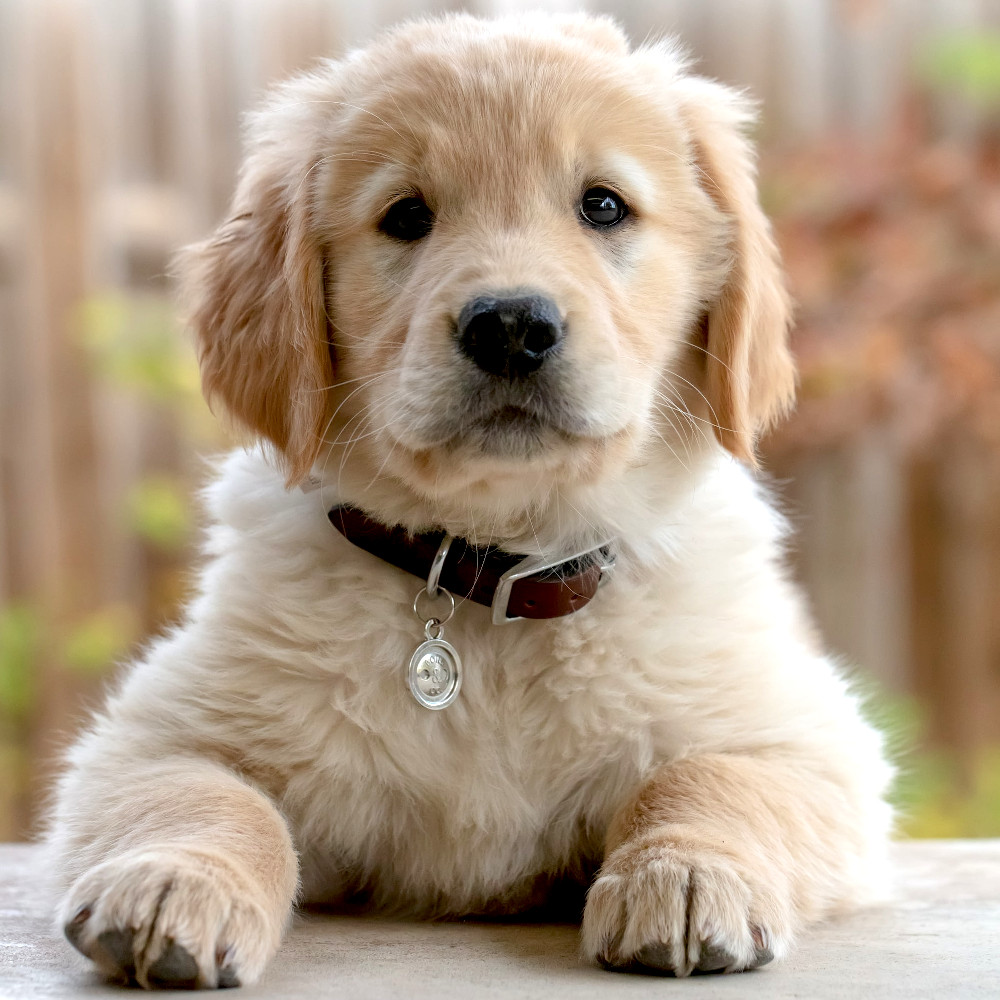

In [4]:
from PIL import Image

img = Image.open(path_lecture/"dog_sample_image.jpeg")
img

#### 참고: 데이터 증강(Data Augmentation)

- 주어진 이미지 데이터를 기반으로 양을 부풀려 사용해야 할 때 이미지 회전, 반전, 축소, 확대 등의 기법 사용
- 주어진 데이터를 기반으로 더 많은 데이터 확보 가능
- 데이터 편향성을 일부 제거 가능

Augmentation Type: flip_vertically


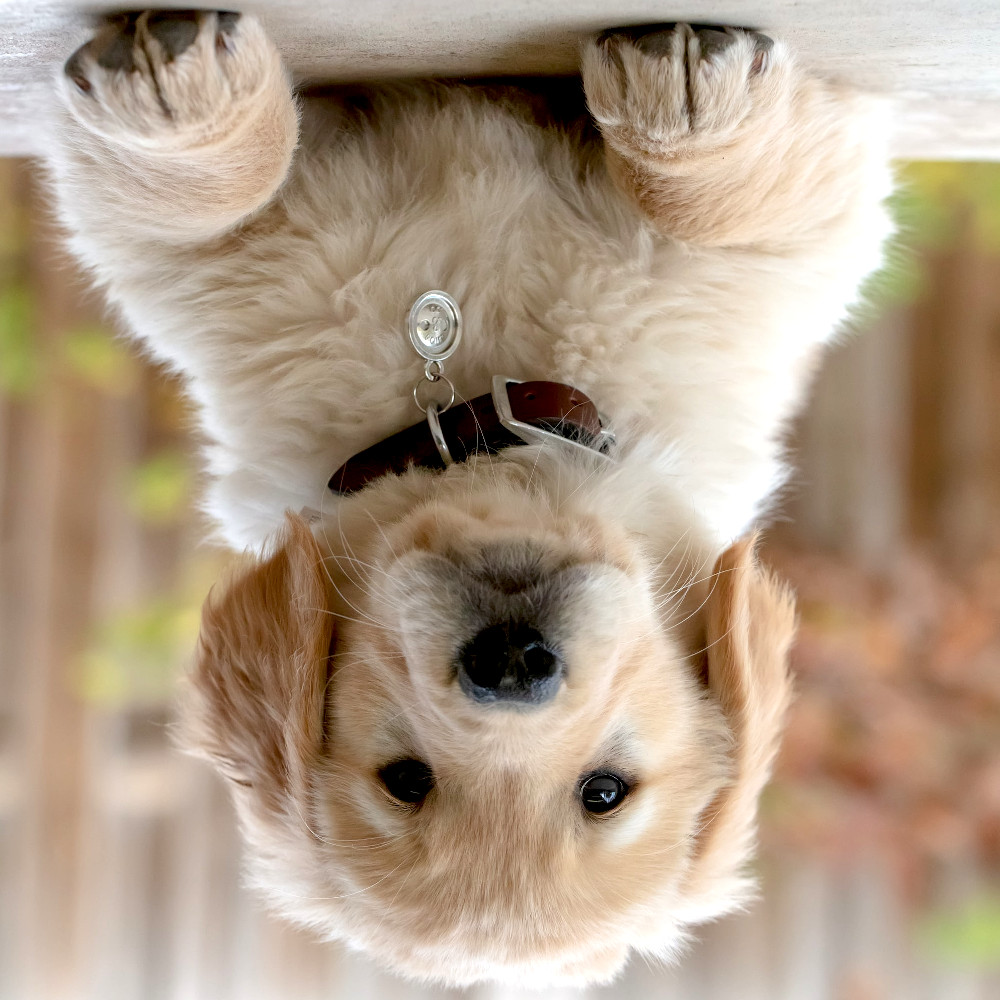




Augmentation Type: flip_horizontally


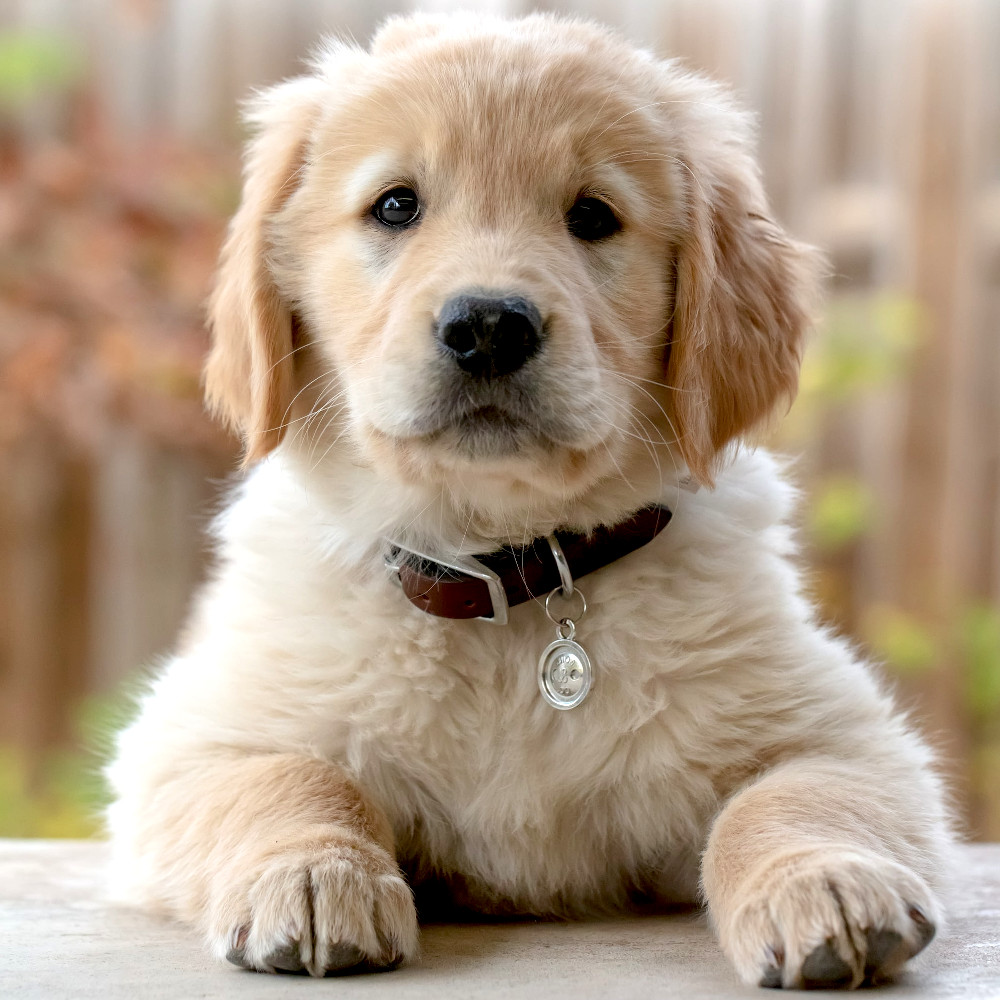




Augmentation Type: rotate


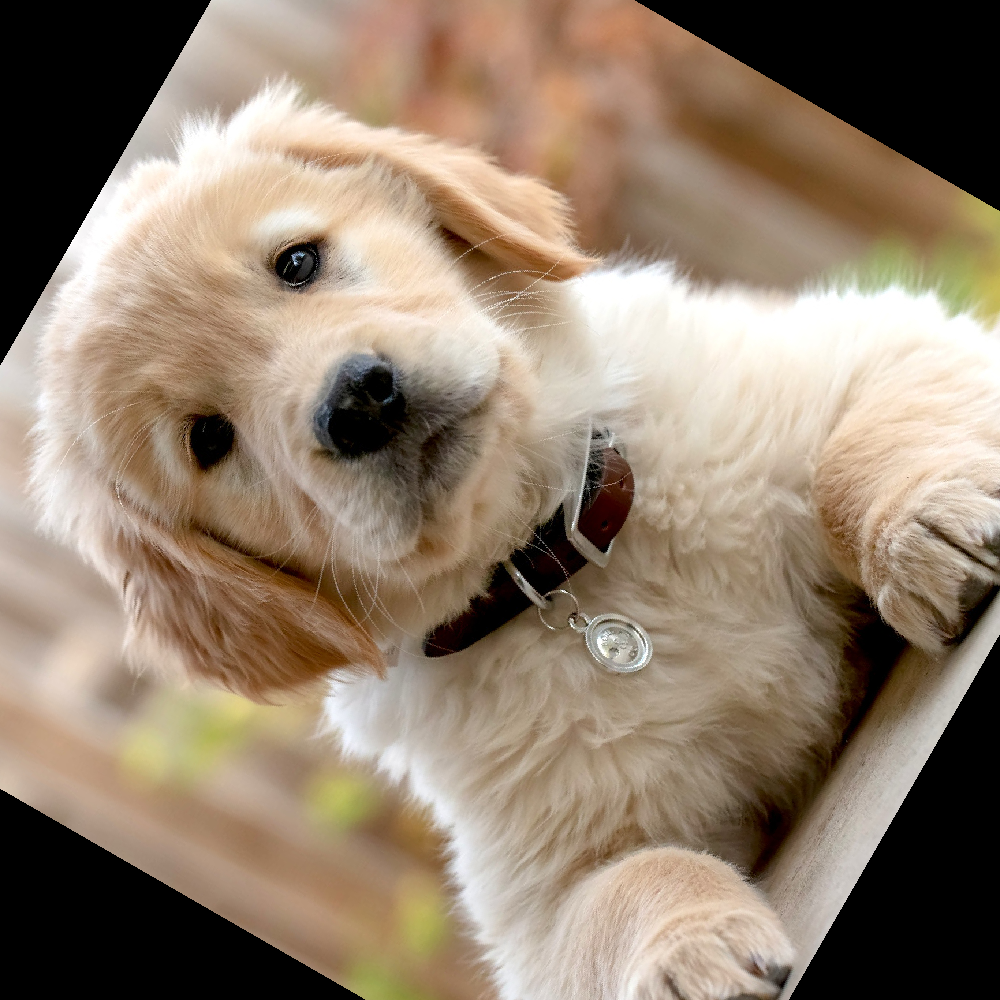




Augmentation Type: scale_up


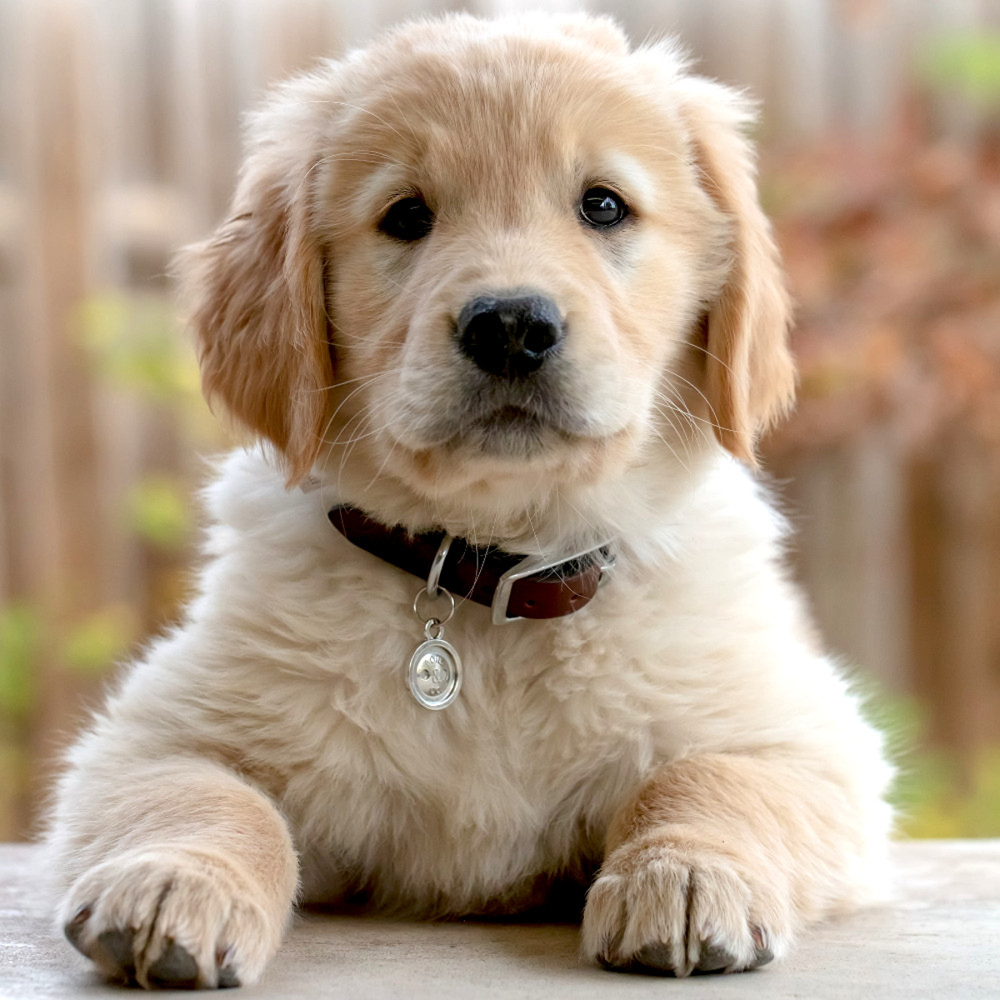




Augmentation Type: scale_down


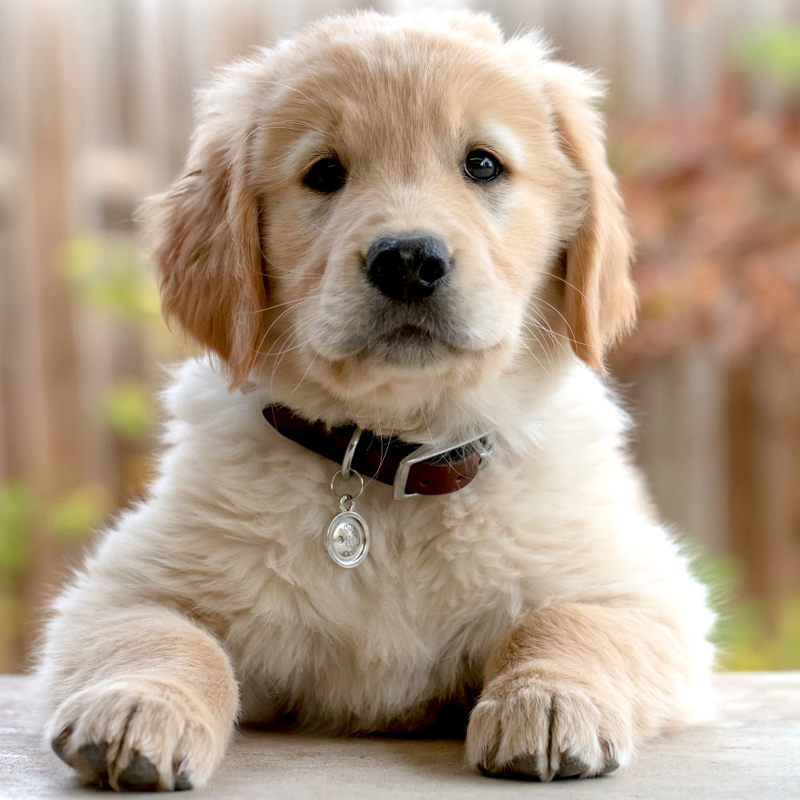

In [5]:
width, height = img.size
img_dict = {
    "flip_vertically": img.transpose(Image.FLIP_TOP_BOTTOM),
    "flip_horizontally": img.transpose(Image.FLIP_LEFT_RIGHT),
    "rotate" : img.rotate(60),
    "scale_up": img.resize((int(width * 1.2), int(height * 1.2))),
    "scale_down": img.resize((int(width * 0.8), int(height * 0.8)))
    }

for augmentation_type, augmented_image in img_dict.items():
    print(f"Augmentation Type: {augmentation_type}")
    display(augmented_image)
    print("\n\n")

In [6]:
import numpy as np

print("이미지의 shape", np.array(img).shape)

이미지의 shape (1000, 1000, 3)
